In [36]:
import torch
from torch import nn, optim
import torch.nn.functional as F

from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import scanpy as sc
from pandas_profiling import ProfileReport
import plotly.express as px
import plotly.io as pio
import sklearn.preprocessing
import umap
import pyro
import pyro.distributions as dist
import pyro.contrib.examples.util  # patches torchvision
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam

pio.renderers.default = "notebook"

In [37]:
import platform
platform.platform()
if torch.has_mps:
     device = torch.device('mps')

In [38]:
# ## Load Data

scdata = sc.read_h5ad("/Users/eamonmcandrew/Desktop/Single_cell_integration/Data/Multi-ome/GEX.h5ad")

In [39]:
scdata.shape

(69249, 13431)

In [40]:
# sc.pp.log1p(scdata)

In [41]:
class GEX_Dataset(torch.utils.data.Dataset):
    
      def __init__(self, data,  scaler = None, cat_var = None):
            self.data = data
            self.values = data.X.todense()
            self.cat_var = cat_var
            self.cat_var_data =  torch.tensor(sklearn.preprocessing.LabelEncoder().fit_transform(self.data.obs[self.cat_var]))
            
            if scaler == "Standard":
                self.scaled_values = torch.tensor(sklearn.preprocessing.StandardScaler().fit_transform(self.values))
            elif scaler == "MinMax":
                self.scaled_values = torch.tensor(sklearn.preprocessing.MinMaxScaler().fit_transform(self.values))
            else:
                self.scaled_values = torch.tensor(self.values)
                
                
      @property
      def n_features(self):
          return self.values.shape[1]
          
      def __len__(self):
          return len(self.data)
    
      def __getitem__(self, idx):
           return self.scaled_values[idx], self.cat_var_data[idx]

    

In [42]:
GEX_Dataset = GEX_Dataset(scdata, scaler = "Standard", cat_var = "batch")

/Users/eamonmcandrew/opt/anaconda3/envs/scINTEGRATION/lib/python3.9/site-packages/sklearn/utils/validation.py:727: FutureWarning:

np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html

/Users/eamonmcandrew/opt/anaconda3/envs/scINTEGRATION/lib/python3.9/site-packages/sklearn/utils/validation.py:727: FutureWarning:

np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html



In [8]:
input_size = GEX_Dataset.n_features
hidden_size = 128 # hidden dimension
latent_size = 16  # latent vector dimension

batch_size = 256
epochs = 20
lr = 1e-4
train_loss = []
log_interval = 20
checkpoints = "/Users/eamonmcandrew/Desktop/Single_cell_integration/checkpoints"

In [43]:
GEX_Dataset.n_features

13431

In [9]:
GEX_dataloader = DataLoader(GEX_Dataset, batch_size=batch_size, shuffle=True)
GEX_dataloader_test = DataLoader(GEX_Dataset, batch_size=batch_size, shuffle=False)

In [10]:
class VAE(nn.Module):
    def __init__(self) :
        super(VAE, self).__init__()
        self.efc1 = nn.Linear(input_size, hidden_size)
        self.efc2 = nn.Linear(hidden_size, hidden_size)
        self.efc3_mu = nn.Linear(hidden_size, latent_size)
        self.efc3_sigma = nn.Linear(hidden_size, latent_size)
        
        self.dfc1 = nn.Linear(latent_size, hidden_size)
        self.dfc2 = nn.Linear(hidden_size, hidden_size)
        self.dfc3 = nn.Linear(hidden_size, input_size)
        
    def encode(self, x):
        x = self.efc1(x)
        x = F.relu(x)
        x = self.efc2(x)
        x = F.relu(x)
        mu = self.efc3_mu(x)
        sigma = self.efc3_sigma(x)
        return((mu,sigma))
    
    def reparametarise (self, mu, sigma):
        std = torch.exp(0.5*sigma)
        eps = torch.randn_like(std)
        return(mu + eps*std)
    
    def decode(self, x):
        x = self.dfc1(x)
        x = F.relu(x)
        x = self.dfc2(x)
        x = F.relu(x)
        x = self.dfc3(x)
        x = torch.tanh(x)
        return(x)
    
    def forward(self, x):
        mu, sigma = self.encode(x)
        z = self.reparametarise(mu, sigma)
        x_gen = self.decode(z)
        return(x_gen, mu, sigma)
      

       

In [11]:
def loss_function(x_gen, x, mu, sigma):
    BCE = F.binary_cross_entropy(x_gen, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + sigma - mu.pow(2) - torch.exp(sigma))
    return(BCE + KLD)

In [12]:
def init_layers(layer):
    if type(layer) == nn.Linear:
        torch.nn.init.uniform_(layer.weight -0.08, 0.08)

In [13]:
vae = VAE()
vae.to(device)
vae = vae.apply(init_layers)
optimizer = optim.Adam(vae.parameters(), lr=lr)
vae.train()

VAE(
  (efc1): Linear(in_features=13431, out_features=128, bias=True)
  (efc2): Linear(in_features=128, out_features=128, bias=True)
  (efc3_mu): Linear(in_features=128, out_features=16, bias=True)
  (efc3_sigma): Linear(in_features=128, out_features=16, bias=True)
  (dfc1): Linear(in_features=16, out_features=128, bias=True)
  (dfc2): Linear(in_features=128, out_features=128, bias=True)
  (dfc3): Linear(in_features=128, out_features=13431, bias=True)
)

In [14]:
# checkpoints = "/Users/eamonmcandrew/Desktop/Single_cell_integration/checkpoints"


# for epoch in range(epochs+1):
# 	for batch_idx, (data, _) in enumerate(GEX_dataloader):
# 		data = data.to(device)
# 		optimizer.zero_grad()
# 		x_gen, mu, sigma = vae(data)
# 		loss = loss_function(x_gen, data, mu, sigma)
# 		if torch.isnan(loss):
# 			print(f"Nan Loss @ Epoch {epoch} Batch {batch_idx}")
# 			break
# 		loss.backward()
# 		optimizer.step()
# 		train_loss.append(loss.item())
# 		if batch_idx % log_interval == 0:
# 			print(f"Train epoch {epoch} [{batch_idx*len(data)}/{len(GEX_dataloader.dataset)}] Loss: {loss.item():.6f}")
		
# 		torch.save(vae.state_dict(), os.path.join(checkpoints, f'vae_epoch_{epoch}.pt'))
	





In [15]:
def load_checkpoint(model, optimizer, filename):
    print(f'Loading checkpoint {filename} for model {model}')
    model.load_state_dict(torch.load(filename))
    return model

In [16]:
load_checkpoint(vae, optimizer, os.path.join(checkpoints, 'vae_epoch_4.pt'))
vae.eval()

Loading checkpoint /Users/eamonmcandrew/Desktop/Single_cell_integration/checkpoints/vae_epoch_4.pt for model VAE(
  (efc1): Linear(in_features=13431, out_features=128, bias=True)
  (efc2): Linear(in_features=128, out_features=128, bias=True)
  (efc3_mu): Linear(in_features=128, out_features=16, bias=True)
  (efc3_sigma): Linear(in_features=128, out_features=16, bias=True)
  (dfc1): Linear(in_features=16, out_features=128, bias=True)
  (dfc2): Linear(in_features=128, out_features=128, bias=True)
  (dfc3): Linear(in_features=128, out_features=13431, bias=True)
)


VAE(
  (efc1): Linear(in_features=13431, out_features=128, bias=True)
  (efc2): Linear(in_features=128, out_features=128, bias=True)
  (efc3_mu): Linear(in_features=128, out_features=16, bias=True)
  (efc3_sigma): Linear(in_features=128, out_features=16, bias=True)
  (dfc1): Linear(in_features=16, out_features=128, bias=True)
  (dfc2): Linear(in_features=128, out_features=128, bias=True)
  (dfc3): Linear(in_features=128, out_features=13431, bias=True)
)

In [17]:
def get_embeddings(vae, dataloader):
    with torch.no_grad():
        embeddings = []
        labels = []
        for batch, label in dataloader:
            batch = batch.to(device)
            _, mu, _ = vae(batch)
            embeddings.append(mu.cpu().numpy())
            labels.append(label.cpu().numpy())
        embeddings = np.concatenate(embeddings)
        labels = np.concatenate(labels)
        return embeddings, labels

In [18]:
embeddings, labels = get_embeddings(vae, GEX_dataloader_test)


In [19]:
labels

array([ 0,  0,  0, ..., 12, 12, 12])

In [20]:
def plot_embeddings(dataframe, color_by=None, title=None):
    fig = px.scatter(dataframe, x=0, y=1, color=color_by, title=title)
    fig.show()
    

In [21]:
dataframe = pd.DataFrame(embeddings, index = labels)

In [22]:
fig = px.scatter(scdata.obsm["GEX_X_pca"], x=0, y=1, color=scdata.obs["batch"], template="simple_white")
fig = fig.update_layout(
    autosize=False,
    width=1400,
    height=1000)
fig.show()


In [23]:
plot_embeddings(dataframe, color_by=dataframe.index, title="VAE Embeddings")

In [24]:
scdata.obsm["VAE_z"] = embeddings

In [25]:
scdata.obsm["VAE_z"].shape

(69249, 16)

In [26]:
sc.pp.neighbors(scdata, use_rep="VAE_z")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [27]:
sc.tl.umap(scdata, min_dist=0.3)

In [28]:
scdata

AnnData object with n_obs × n_vars = 69249 × 13431
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'neighbors', 'umap'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap', 'VAE_z', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

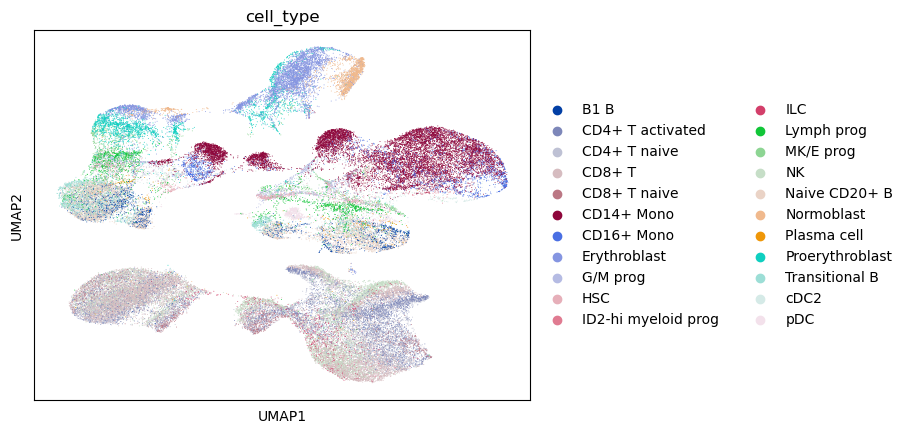

In [29]:
sc.pl.umap(scdata, color="cell_type", wspace=0.5)

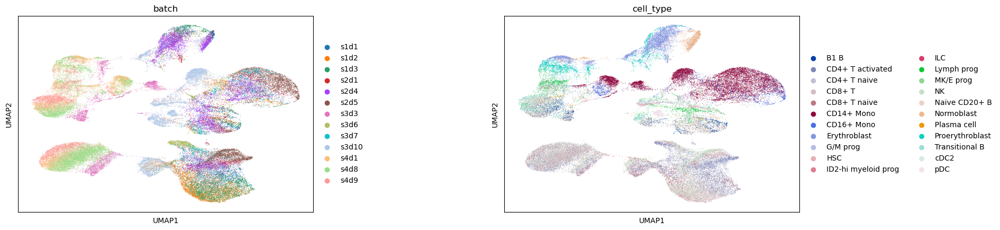

In [30]:
sc.pl.umap(scdata, color=["batch", "cell_type"], wspace=0.5)

In [31]:
def decode_embeddings(vae, embeddings):
    with torch.no_grad():
        embeddings = torch.tensor(embeddings).to(device)
        x_gen = vae.decode(embeddings)
        return x_gen.cpu().numpy()

In [32]:
scdata.obsm["VAE_x"] = decode_embeddings(vae, embeddings)

In [33]:
sc.pp.neighbors(scdata, use_rep="VAE_x", n_neighbors=30)

In [34]:
sc.tl.umap(scdata, min_dist=0.3)

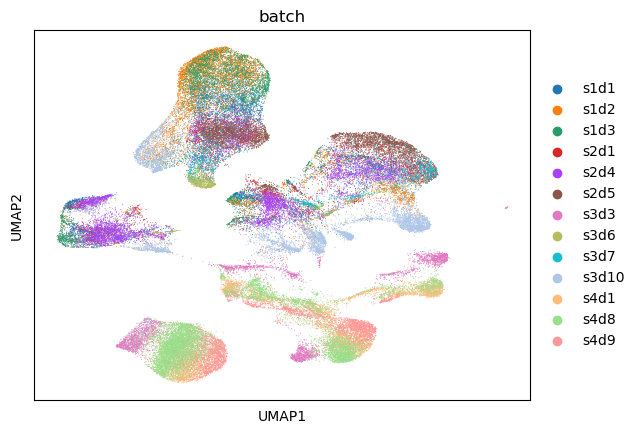

In [35]:
sc.pl.umap(scdata, color="batch")